In [1]:
import zipfile
import os
import glob
import random
from matplotlib import pyplot as plt

import numpy as np
import pandas as pd

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard

from tensorflow.keras.applications.vgg16 import preprocess_input as vgg_preprocess
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input as efficientnet_preprocess
from tensorflow.keras.applications.mobilenet import preprocess_input as mobilenet_preprocess

## Unzip data file

In [2]:


# # Path to your zip file
# zip_path = './../data/ninjacart_data.zip'

# # Directory to extract to
# extract_to = './../data/'

# # Unzip the file
# with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#     zip_ref.extractall(extract_to)


## Plot Traning data

In [3]:
class_dir = os.listdir('./../data/ninjacart_data/train')
image_dict = dict()
count_dict = dict()

for cls in class_dir:
    path = glob.glob(f'./../data/ninjacart_data/train/{cls}/*')
        
    count_dict[cls] = len(path)
    
    random_img = random.sample(path, k=3)
    
    image_dict[cls] = [keras.utils.load_img(img) for img in random_img]
    

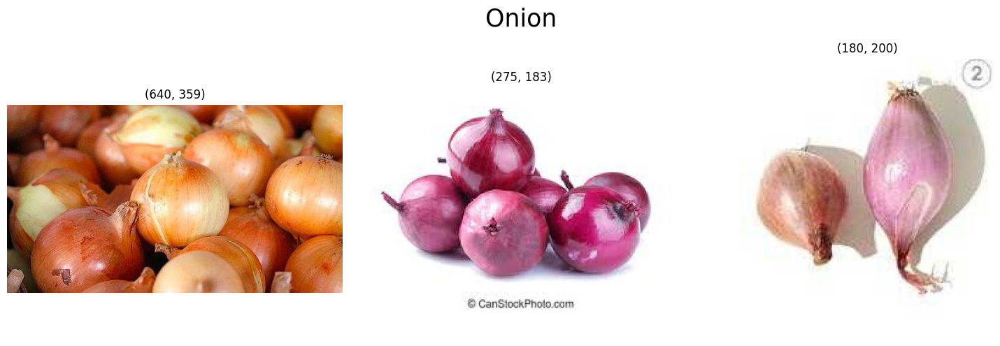

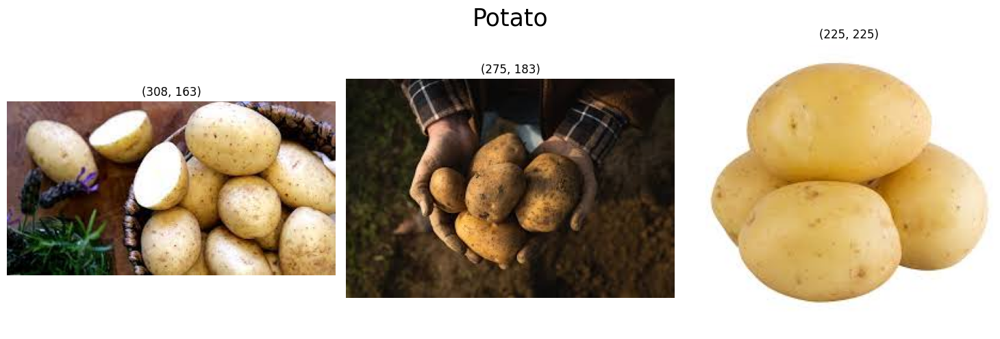

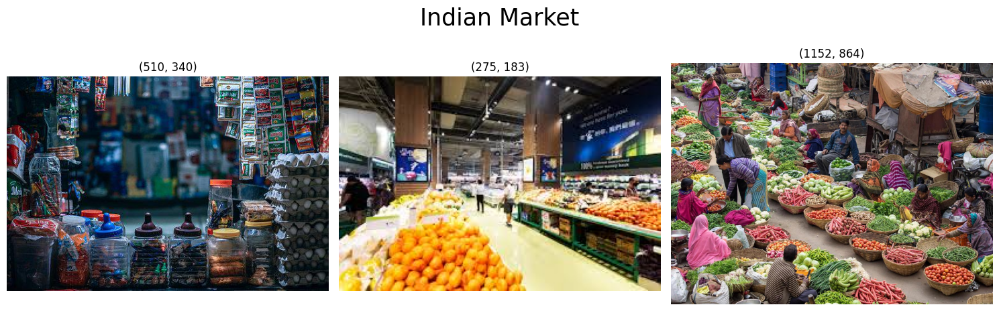

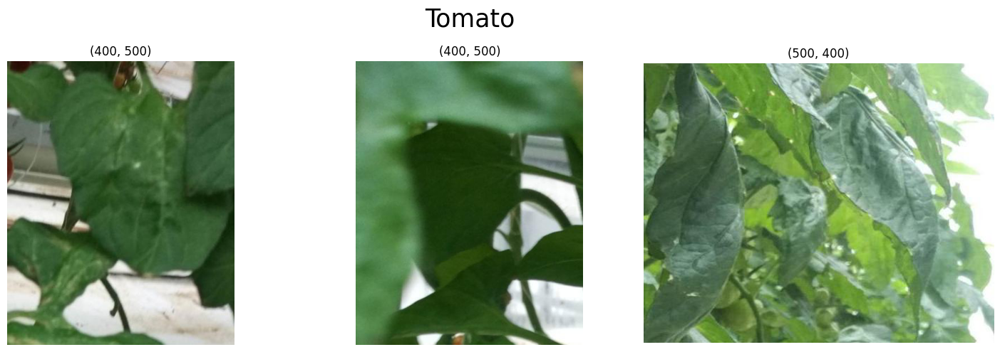

In [4]:
## Plot image

for cls, images in image_dict.items():
    plt.figure(figsize=(15, 5))
    
    for i in range(3):
        plt.subplot(1,3,i+1)
        plt.imshow(images[i])
        plt.title(images[i].size)
        plt.axis('off')
    
    plt.suptitle(cls.title(), fontsize=25)
    plt.tight_layout()
    plt.show()


In [5]:
## Check image count in train data set

for cls, count in count_dict.items():
    print(f'{cls.title()}: {count}')

Onion: 849
Potato: 898
Indian Market: 599
Tomato: 789


<Axes: title={'center': 'Training data count per class'}, xlabel='class'>

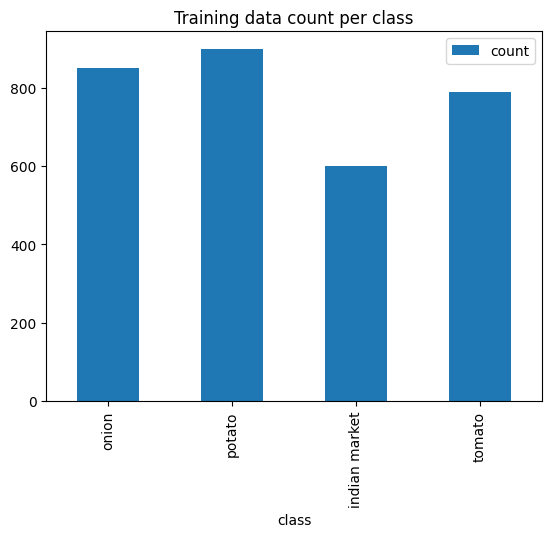

In [6]:
df = pd.DataFrame({
    'class': count_dict.keys(),
    'count': count_dict.values()
})

df.plot.bar(x='class', y='count', title='Training data count per class')

## Plot testing data

In [7]:
class_dir = os.listdir('./../data/ninjacart_data/test')
image_dict = dict()
count_dict = dict()

for cls in class_dir:
    path = glob.glob(f'./../data/ninjacart_data/test/{cls}/*')
        
    count_dict[cls] = len(path)
    
    random_img = random.sample(path, k=3)
    
    image_dict[cls] = [keras.utils.load_img(img) for img in random_img]
    

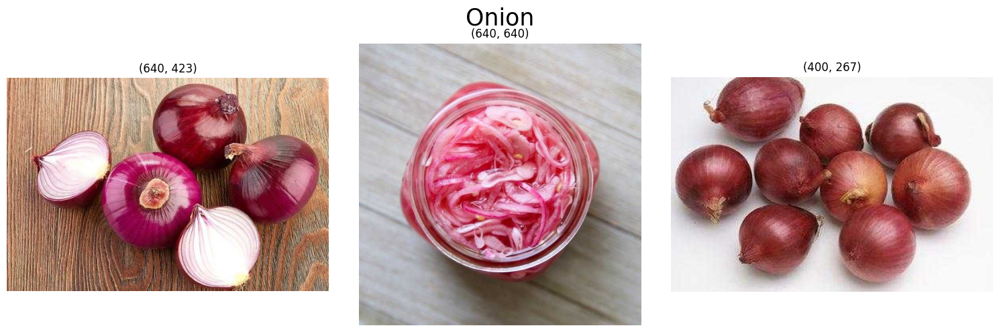

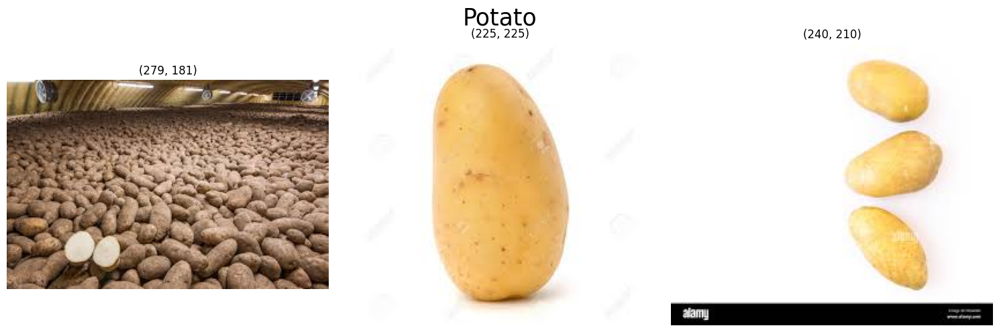

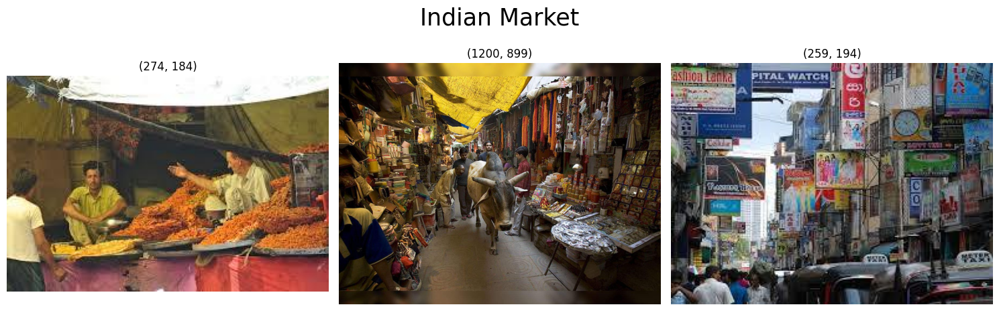

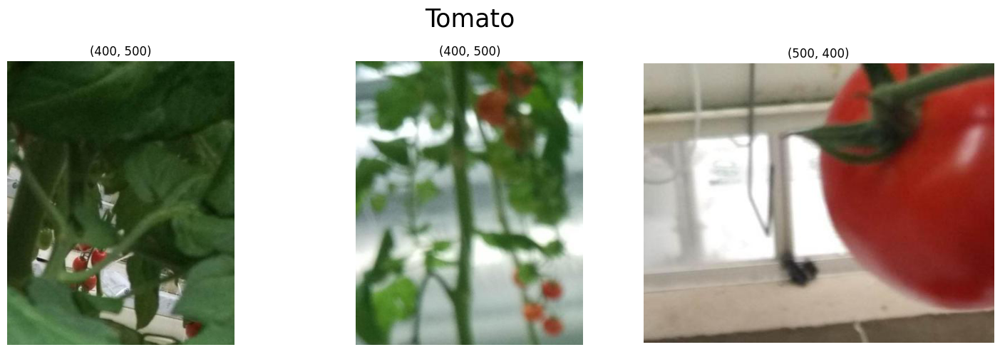

In [8]:
## Plot image

for cls, images in image_dict.items():
    plt.figure(figsize=(15, 5))
    
    for i in range(3):
        plt.subplot(1,3,i+1)
        plt.imshow(images[i])
        plt.title(images[i].size)
        plt.axis('off')
    
    plt.suptitle(cls.title(), fontsize=25)
    plt.tight_layout()
    plt.show()


In [9]:
## Check image count in test data set

for cls, count in count_dict.items():
    print(f'{cls.title()}: {count}')

Onion: 83
Potato: 81
Indian Market: 81
Tomato: 106


<Axes: title={'center': 'Testing data count per class'}, xlabel='class'>

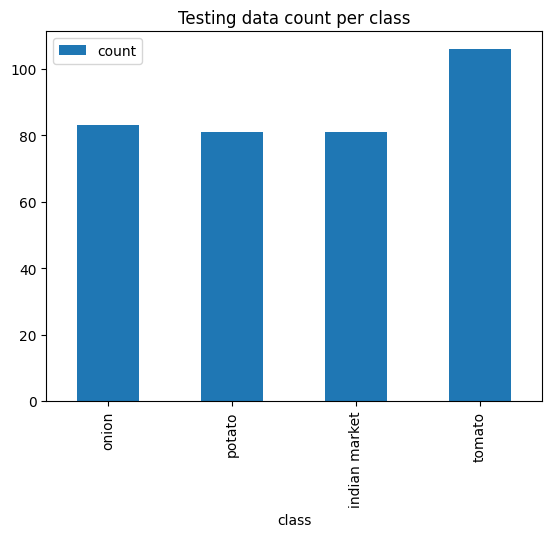

In [10]:
df = pd.DataFrame({
    'class': count_dict.keys(),
    'count': count_dict.values()
})

df.plot.bar(x='class', y='count', title='Testing data count per class')

## Train validation split

In [11]:
# Split into training and validation data set

train_ds_resized = keras.utils.image_dataset_from_directory(
    './../data/ninjacart_data/train',
    validation_split=0.2,
    seed=629,
    subset='training',
    image_size=(224, 224),
    batch_size=32,
    shuffle=True
)

val_ds_resized = keras.utils.image_dataset_from_directory(
    './../data/ninjacart_data/train',
    validation_split=0.2,
    seed=629,
    subset='validation',
    image_size=(224, 224),
    batch_size=32
)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Found 3135 files belonging to 4 classes.
Using 627 files for validation.


2025-07-22 11:49:21.972594: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2025-07-22 11:49:21.972821: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 32.00 GB
2025-07-22 11:49:21.972834: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 10.67 GB
2025-07-22 11:49:21.973078: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-07-22 11:49:21.973093: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [12]:
test_ds_resized = keras.utils.image_dataset_from_directory(
    './../data/ninjacart_data/test',
    image_size=(224, 224),
    batch_size=32,
    shuffle=False
)

class_names = test_ds_resized.class_names

Found 351 files belonging to 4 classes.


In [13]:
data_augmentation = keras.Sequential([
    keras.layers.RandomFlip("horizontal"),
    keras.layers.RandomRotation(0.1),
    keras.layers.RandomZoom(0.1),
    keras.layers.RandomTranslation(0.1, 0.1),
    keras.layers.RandomContrast(0.2)  
])


In [14]:
# scale image

train_ds_scaled = train_ds_resized.map(lambda x, y: (keras.layers.Rescaling(1./255)(x), y))

val_ds_scaled = val_ds_resized.map(lambda x, y: (keras.layers.Rescaling(1./255)(x), y))

test_ds_scaled = test_ds_resized.map(lambda x, y: (keras.layers.Rescaling(1./255)(x), y))

## VGG Model

In [15]:
vgg16_base = keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=[224,224, 3])

vgg16_base.trainable = False

In [16]:
vgg_model = keras.Sequential([
    keras.layers.Input(shape=(224, 224, 3)),
    data_augmentation,
    keras.layers.Lambda(vgg_preprocess),
    vgg16_base,
    keras.layers.GlobalAveragePooling2D(),
    keras.layers.Dropout(rate=0.3),
    keras.layers.Dense(4, activation='softmax')
])

In [17]:
vgg_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [18]:
log_dir = "logs/VGG16"

callbacks = [
    EarlyStopping(monitor='val_loss', restore_best_weights=True, patience=3),
    ModelCheckpoint('vgg_best_weights.h5', monitor='val_loss', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.02, patience=2),
    TensorBoard(log_dir=log_dir, histogram_freq=1)
]

In [19]:
history = vgg_model.fit(train_ds_resized, epochs=50, validation_data=val_ds_resized, callbacks=callbacks)

Epoch 1/50


2025-07-22 11:49:24.225641: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - accuracy: 0.4982 - loss: 3.0701

79/79 ━━━━━━━━━━━━━━━━━━━━ 29s 353ms/step - accuracy: 0.4999 - loss: 3.0587 - val_accuracy: 0.8772 - val_loss: 0.6741 - learning_rate: 0.0010
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.8124 - loss: 0.9889

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 340ms/step - accuracy: 0.8125 - loss: 0.9880 - val_accuracy: 0.9234 - val_loss: 0.4306 - learning_rate: 0.0010
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.8650 - loss: 0.6524

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 342ms/step - accuracy: 0.8651 - loss: 0.6514 - val_accuracy: 0.9234 - val_loss: 0.4295 - learning_rate: 0.0010
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.8902 - loss: 0.5061

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 343ms/step - accuracy: 0.8902 - loss: 0.5062 - val_accuracy: 0.9298 - val_loss: 0.3517 - learning_rate: 0.0010
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.9107 - loss: 0.4146

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 342ms/step - accuracy: 0.9107 - loss: 0.4141 - val_accuracy: 0.9330 - val_loss: 0.3243 - learning_rate: 0.0010
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9014 - loss: 0.3911

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 340ms/step - accuracy: 0.9015 - loss: 0.3907 - val_accuracy: 0.9378 - val_loss: 0.2921 - learning_rate: 0.0010
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9181 - loss: 0.3586

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 343ms/step - accuracy: 0.9181 - loss: 0.3581 - val_accuracy: 0.9378 - val_loss: 0.2778 - learning_rate: 0.0010
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9292 - loss: 0.3091

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 340ms/step - accuracy: 0.9292 - loss: 0.3089 - val_accuracy: 0.9522 - val_loss: 0.2401 - learning_rate: 0.0010
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9317 - loss: 0.2601

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 341ms/step - accuracy: 0.9316 - loss: 0.2603 - val_accuracy: 0.9506 - val_loss: 0.2375 - learning_rate: 0.0010
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 337ms/step - accuracy: 0.9325 - loss: 0.2613 - val_accuracy: 0.9474 - val_loss: 0.2396 - learning_rate: 0.0010
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9456 - loss: 0.2002

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 340ms/step - accuracy: 0.9455 - loss: 0.2003 - val_accuracy: 0.9474 - val_loss: 0.2227 - learning_rate: 0.0010
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 341ms/step - accuracy: 0.9314 - loss: 0.2698 - val_accuracy: 0.9506 - val_loss: 0.2315 - learning_rate: 0.0010
Epoch 13/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 341ms/step - accuracy: 0.9406 - loss: 0.2270 - val_accuracy: 0.9506 - val_loss: 0.2230 - learning_rate: 0.0010
Epoch 14/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9363 - loss: 0.2022

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 343ms/step - accuracy: 0.9364 - loss: 0.2021 - val_accuracy: 0.9537 - val_loss: 0.2195 - learning_rate: 2.0000e-05
Epoch 15/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9478 - loss: 0.1684

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 342ms/step - accuracy: 0.9478 - loss: 0.1685 - val_accuracy: 0.9553 - val_loss: 0.2149 - learning_rate: 2.0000e-05
Epoch 16/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 341ms/step - accuracy: 0.9387 - loss: 0.2175 - val_accuracy: 0.9553 - val_loss: 0.2149 - learning_rate: 2.0000e-05
Epoch 17/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.9460 - loss: 0.2032

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 341ms/step - accuracy: 0.9460 - loss: 0.2030 - val_accuracy: 0.9553 - val_loss: 0.2129 - learning_rate: 2.0000e-05
Epoch 18/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.9300 - loss: 0.2362

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 341ms/step - accuracy: 0.9301 - loss: 0.2359 - val_accuracy: 0.9553 - val_loss: 0.2116 - learning_rate: 2.0000e-05
Epoch 19/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.9462 - loss: 0.2074

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 341ms/step - accuracy: 0.9462 - loss: 0.2074 - val_accuracy: 0.9553 - val_loss: 0.2113 - learning_rate: 2.0000e-05
Epoch 20/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9493 - loss: 0.1806

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 342ms/step - accuracy: 0.9493 - loss: 0.1807 - val_accuracy: 0.9553 - val_loss: 0.2091 - learning_rate: 2.0000e-05
Epoch 21/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.9534 - loss: 0.1554

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 341ms/step - accuracy: 0.9533 - loss: 0.1554 - val_accuracy: 0.9553 - val_loss: 0.2087 - learning_rate: 2.0000e-05
Epoch 22/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 341ms/step - accuracy: 0.9383 - loss: 0.1983 - val_accuracy: 0.9553 - val_loss: 0.2090 - learning_rate: 2.0000e-05
Epoch 23/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9516 - loss: 0.1597

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 343ms/step - accuracy: 0.9516 - loss: 0.1597 - val_accuracy: 0.9537 - val_loss: 0.2078 - learning_rate: 2.0000e-05
Epoch 24/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9400 - loss: 0.1968

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 341ms/step - accuracy: 0.9401 - loss: 0.1967 - val_accuracy: 0.9537 - val_loss: 0.2068 - learning_rate: 2.0000e-05
Epoch 25/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.9391 - loss: 0.2171

79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 342ms/step - accuracy: 0.9391 - loss: 0.2168 - val_accuracy: 0.9553 - val_loss: 0.2053 - learning_rate: 2.0000e-05
Epoch 26/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 342ms/step - accuracy: 0.9545 - loss: 0.1658 - val_accuracy: 0.9553 - val_loss: 0.2053 - learning_rate: 2.0000e-05
Epoch 27/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 340ms/step - accuracy: 0.9457 - loss: 0.2015 - val_accuracy: 0.9537 - val_loss: 0.2059 - learning_rate: 2.0000e-05
Epoch 28/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 27s 339ms/step - accuracy: 0.9502 - loss: 0.1682 - val_accuracy: 0.9537 - val_loss: 0.2059 - learning_rate: 4.0000e-07


In [20]:
# Plot matrix

def plot_matrix(metrics, history):
    no_of_matrix = len(metrics)
    fig, ax = plt.subplots(1, no_of_matrix, figsize=(5 * no_of_matrix, 5))
    
    for index, metric in enumerate(metrics):
        ax[index].plot(history.history[metric])
        
        ax[index].plot(history.history[f'val_{metric}'])
        
        ax[index].legend([metric, f'val_{metric}'])
        ax[index].set_xlabel('Epochs')
        ax[index].set_ylabel(metric)
        
    plt.tight_layout()
    plt.show()

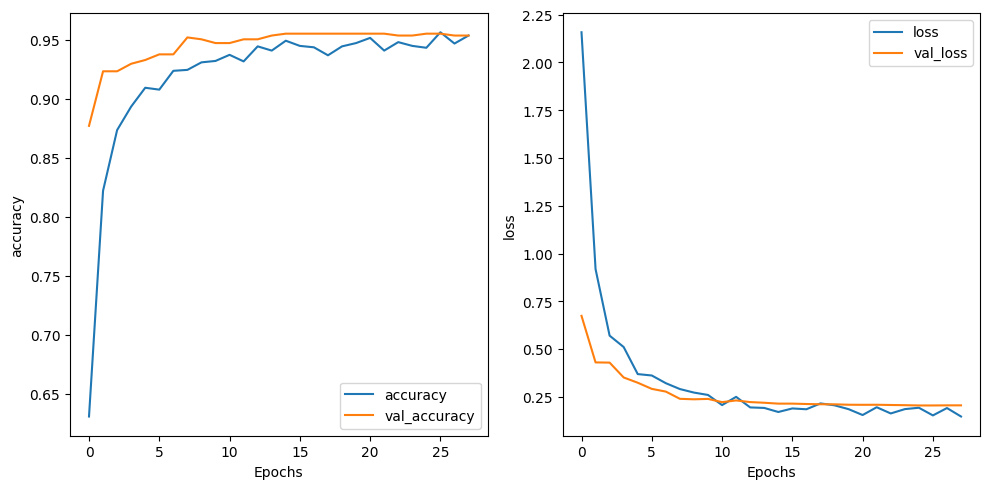

In [21]:
plot_matrix(['accuracy', 'loss'], history)

**Observation:** After 4 epoch the loss and accuracy gets stable, there is hardly any improvement a clear sign of overfitting is observed

In [22]:
loss, acc = vgg_model.evaluate(test_ds_resized)

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - accuracy: 0.8113 - loss: 1.0633


In [23]:
images = tf.concat([x for x, _ in test_ds_scaled], axis=0)
y_true = tf.concat([y for _, y in test_ds_resized], axis=0)
y_pred = vgg_model.predict(test_ds_resized)

2025-07-22 12:02:03.562559: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-07-22 12:02:03.748216: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step


In [24]:

def show_prediction(images, y_true, y_pred, no_of_pred, n_row, n_col):
    """
    Display a grid of image predictions with true and predicted labels.

    Parameters
    ----------
    images : array-like or Tensor
        The input images to display.
    
    y_true : array-like or Tensor
        True class labels corresponding to the input images.
    
    y_pred : array-like or Tensor
        Model prediction outputs (e.g., softmax probabilities or class indices).
    
    no_of_pred : int
        Number of images/predictions to display.
    
    n_row : int
        Number of rows in the subplot grid.
    
    n_col : int
        Number of columns in the subplot grid.

    Returns
    -------
    None
        Displays the matplotlib figure with the predictions.
    """
    indices = random.sample(range(len(images)), no_of_pred)
    
    total_plots = n_row * n_col
    empty_spaces = total_plots - no_of_pred
    
    if empty_spaces < 0:
        print("No of Prediction are more than the allocated row and column combination.")
        return
    else:
        empty_spaces = total_plots - empty_spaces

    fig, ax = plt.subplots(n_row, n_col, figsize=(3*n_row, 3*n_col))

    ax = ax.flatten()

    for i, index in enumerate(indices):        
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        
        # Plot image
        ax[i].imshow(images[index])
        
        # Identify of the prediction is correct
        prediction = np.argmax(y_pred[index])
        actual = y_true[index]
        
        color = 'green' if prediction == actual else 'red'
        
        ax[i].set_xlabel(f'Actual: {class_names[actual].title()}, \nPredicted: {class_names[prediction].title()}', color=color)
        
    
    # turn off the remaining axis
    for i in range(empty_spaces, total_plots):
        ax[i].axis('off')
            
    plt.tight_layout()
    plt.show()
  

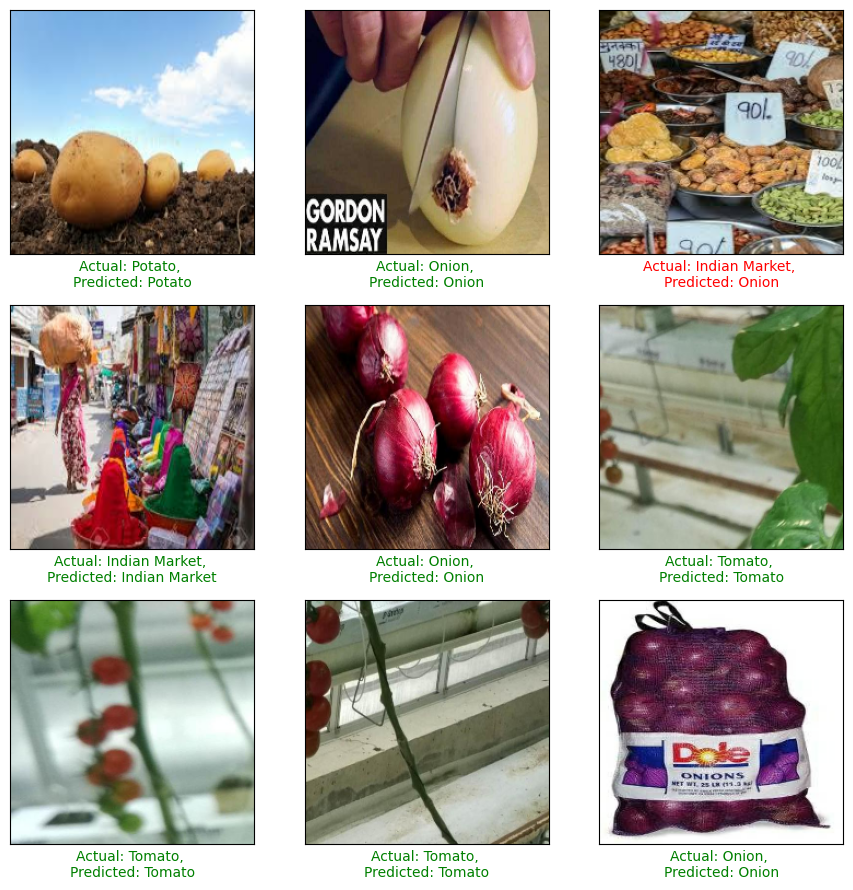

In [25]:
show_prediction(images, y_true, y_pred, 9, 3, 3)

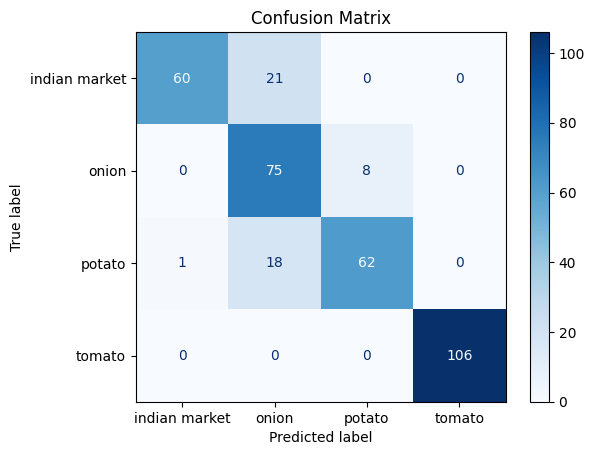

In [26]:
y_pred_classes = np.argmax(y_pred, axis=1)

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Display it
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

## ResNet

In [27]:
input_tensor = keras.layers.Input(shape=(224, 224, 3))

# Augmentation + Preprocessing
x = data_augmentation(input_tensor)
x = keras.layers.Lambda(resnet_preprocess)(x)

resnet_base = keras.applications.ResNet50(weights='imagenet', include_top=False, input_tensor=x)

resnet_base.trainable = False

x = resnet_base.output
x = keras.layers.GlobalAveragePooling2D()(x)

# x = keras.layers.BatchNormalization()(x)
# x = keras.layers.Dense(64, activation='relu')(x)

# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(rate=0.3)(x)
x = keras.layers.Dense(4, activation='softmax')(x)

resnet50_model = keras.models.Model(inputs=input_tensor, outputs=x)

In [28]:
resnet50_model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-2),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

In [29]:
log_dir = "logs/ResNet50"

callbacks = [
    EarlyStopping(monitor='val_loss', restore_best_weights=True, patience=3),
    ModelCheckpoint('resnet50_weights.h5', monitor='val_loss', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.02, patience=2),
    TensorBoard(log_dir=log_dir, histogram_freq=1)
]

In [30]:
# process_train_ds = train_ds_resized.map(lambda x, y: (resnet_preprocess(x), y))
process_val_ds = val_ds_resized.map(lambda x, y: (resnet_preprocess(x), y))
process_test_ds = test_ds_resized.map(lambda x,y: (resnet_preprocess(x), y))

history_resnet = resnet50_model.fit(train_ds_resized, epochs=50, validation_data=process_val_ds, callbacks=callbacks)

Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.7669 - loss: 1.1323

79/79 ━━━━━━━━━━━━━━━━━━━━ 30s 329ms/step - accuracy: 0.7683 - loss: 1.1252 - val_accuracy: 0.9011 - val_loss: 0.3880 - learning_rate: 0.0100
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 21s 265ms/step - accuracy: 0.9574 - loss: 0.1721 - val_accuracy: 0.9107 - val_loss: 0.5588 - learning_rate: 0.0100
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 21s 263ms/step - accuracy: 0.9454 - loss: 0.2039 - val_accuracy: 0.8038 - val_loss: 1.4140 - learning_rate: 0.0100
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 21s 264ms/step - accuracy: 0.9489 - loss: 0.2684 - val_accuracy: 0.8756 - val_loss: 0.8753 - learning_rate: 2.0000e-04


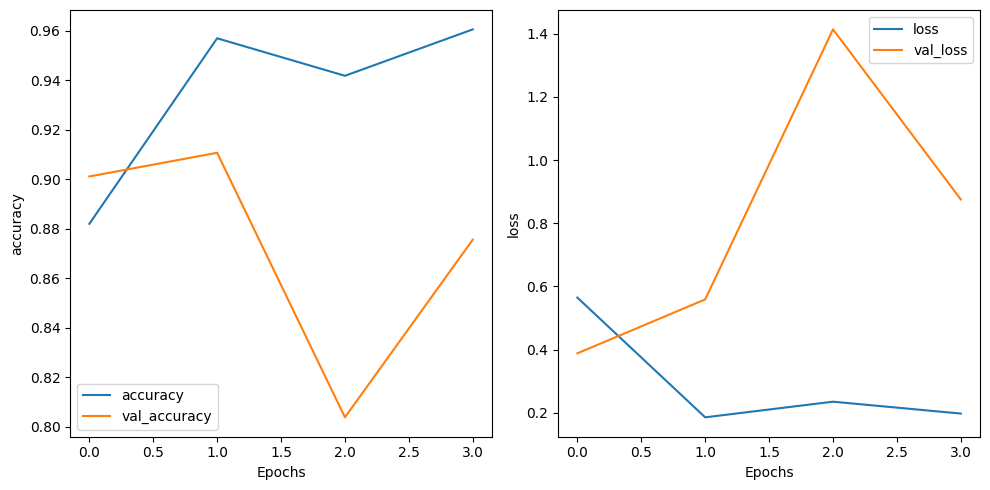

In [31]:
plot_matrix(['accuracy', 'loss'], history_resnet)

In [32]:
loss, acc = resnet50_model.evaluate(process_test_ds)

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step - accuracy: 0.8947 - loss: 0.6879


In [33]:
y_pred = resnet50_model.predict(process_test_ds)

11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 376ms/step


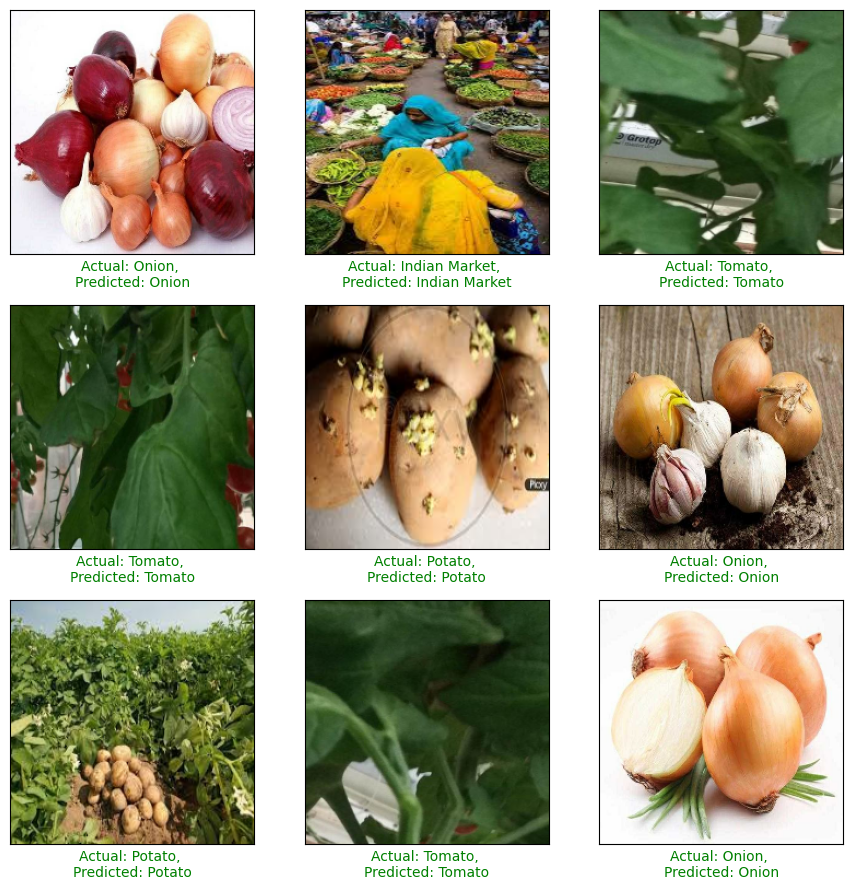

In [34]:
show_prediction(images, y_true, y_pred, 9, 3, 3)

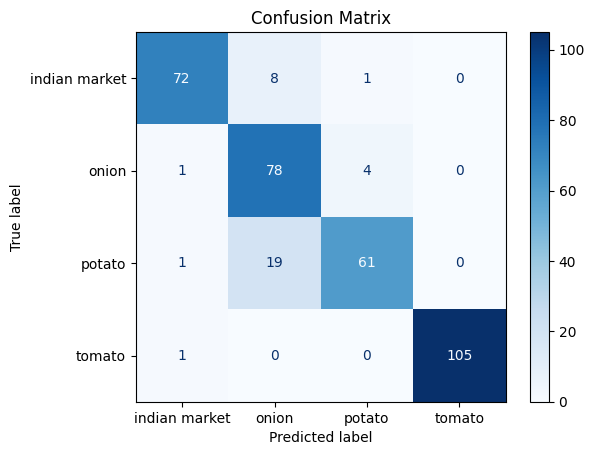

In [35]:
y_pred_classes = np.argmax(y_pred, axis=1)

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Display it
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

## EfficientNet

In [36]:
input_tensor = keras.layers.Input(shape=(224, 224, 3))

# Augmentation + Preprocessing
x = data_augmentation(input_tensor)
x = keras.layers.Lambda(efficientnet_preprocess)(x)

efficientnet_base = EfficientNetB0(weights='imagenet', include_top=False, input_tensor=x)

efficientnet_base.trainable = False

In [37]:
x = efficientnet_base.output

x = keras.layers.GlobalAveragePooling2D()(x)

# x = keras.layers.BatchNormalization()(x)
# x = keras.layers.Dense(64, activation='relu', kernel_regularizer=keras.regularizers.l2(0.002))(x)

# x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dropout(rate=0.3)(x)
x = keras.layers.Dense(4, activation='sigmoid', kernel_regularizer=keras.regularizers.l2(0.002))(x)

efficientnet_model = keras.models.Model(inputs=input_tensor, outputs=x)


In [38]:
efficientnet_model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
)

In [39]:
log_dir = "logs/EfficientNetB0"

callbacks = [
    EarlyStopping(monitor='val_loss', restore_best_weights=True, patience=5),
    ModelCheckpoint('efficientnet_weights.h5', monitor='val_loss', save_best_only=True),
    ReduceLROnPlateau(monitor='loss', factor=0.05, patience=2),
    TensorBoard(log_dir=log_dir, histogram_freq=1)
]

In [40]:
# process_train_ds = train_ds_resized.map(lambda x, y: (efficientnet_preprocess(x), y))
process_val_ds = val_ds_resized.map(lambda x, y: (efficientnet_preprocess(x), y))
process_test_ds = test_ds_resized.map(lambda x,y: (efficientnet_preprocess(x), y))

history_efficientnet= efficientnet_model.fit(train_ds_resized, epochs=50, validation_data=process_val_ds, callbacks=callbacks)

Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.7373 - loss: 0.7196

79/79 ━━━━━━━━━━━━━━━━━━━━ 29s 282ms/step - accuracy: 0.7387 - loss: 0.7163 - val_accuracy: 0.9569 - val_loss: 0.1974 - learning_rate: 0.0010
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - accuracy: 0.9422 - loss: 0.2141

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 189ms/step - accuracy: 0.9422 - loss: 0.2139 - val_accuracy: 0.9585 - val_loss: 0.1534 - learning_rate: 0.0010
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.9510 - loss: 0.1749

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 189ms/step - accuracy: 0.9511 - loss: 0.1747 - val_accuracy: 0.9633 - val_loss: 0.1355 - learning_rate: 0.0010
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.9585 - loss: 0.1471

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 189ms/step - accuracy: 0.9585 - loss: 0.1471 - val_accuracy: 0.9681 - val_loss: 0.1271 - learning_rate: 0.0010
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.9641 - loss: 0.1294

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 188ms/step - accuracy: 0.9642 - loss: 0.1294 - val_accuracy: 0.9697 - val_loss: 0.1209 - learning_rate: 0.0010
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.9682 - loss: 0.1297

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 189ms/step - accuracy: 0.9682 - loss: 0.1296 - val_accuracy: 0.9697 - val_loss: 0.1173 - learning_rate: 0.0010
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.9760 - loss: 0.1162

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 190ms/step - accuracy: 0.9760 - loss: 0.1162 - val_accuracy: 0.9697 - val_loss: 0.1151 - learning_rate: 0.0010
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.9693 - loss: 0.1147

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 190ms/step - accuracy: 0.9693 - loss: 0.1147 - val_accuracy: 0.9681 - val_loss: 0.1135 - learning_rate: 0.0010
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.9736 - loss: 0.1138

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 190ms/step - accuracy: 0.9736 - loss: 0.1138 - val_accuracy: 0.9697 - val_loss: 0.1127 - learning_rate: 0.0010
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.9714 - loss: 0.1089

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 191ms/step - accuracy: 0.9714 - loss: 0.1089 - val_accuracy: 0.9681 - val_loss: 0.1118 - learning_rate: 0.0010
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.9825 - loss: 0.1076

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 189ms/step - accuracy: 0.9825 - loss: 0.1076 - val_accuracy: 0.9713 - val_loss: 0.1073 - learning_rate: 0.0010
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.9732 - loss: 0.1044

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 190ms/step - accuracy: 0.9732 - loss: 0.1044 - val_accuracy: 0.9681 - val_loss: 0.1060 - learning_rate: 0.0010
Epoch 13/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.9841 - loss: 0.0931

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - accuracy: 0.9841 - loss: 0.0932 - val_accuracy: 0.9697 - val_loss: 0.1052 - learning_rate: 0.0010
Epoch 14/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 185ms/step - accuracy: 0.9844 - loss: 0.0908 - val_accuracy: 0.9697 - val_loss: 0.1063 - learning_rate: 0.0010
Epoch 15/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 186ms/step - accuracy: 0.9841 - loss: 0.0976 - val_accuracy: 0.9681 - val_loss: 0.1053 - learning_rate: 0.0010
Epoch 16/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.9736 - loss: 0.1022

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 190ms/step - accuracy: 0.9737 - loss: 0.1022 - val_accuracy: 0.9713 - val_loss: 0.1019 - learning_rate: 0.0010
Epoch 17/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 186ms/step - accuracy: 0.9798 - loss: 0.0936 - val_accuracy: 0.9697 - val_loss: 0.1024 - learning_rate: 5.0000e-05
Epoch 18/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 186ms/step - accuracy: 0.9865 - loss: 0.0929 - val_accuracy: 0.9697 - val_loss: 0.1025 - learning_rate: 5.0000e-05
Epoch 19/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 186ms/step - accuracy: 0.9841 - loss: 0.0893 - val_accuracy: 0.9697 - val_loss: 0.1026 - learning_rate: 5.0000e-05
Epoch 20/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 185ms/step - accuracy: 0.9824 - loss: 0.0908 - val_accuracy: 0.9697 - val_loss: 0.1026 - learning_rate: 5.0000e-05
Epoch 21/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 185ms/step - accuracy: 0.9840 - loss: 0.0873 - val_accuracy: 0.9697 - val_loss: 0.1028 - learning_rate: 5.0000e-05


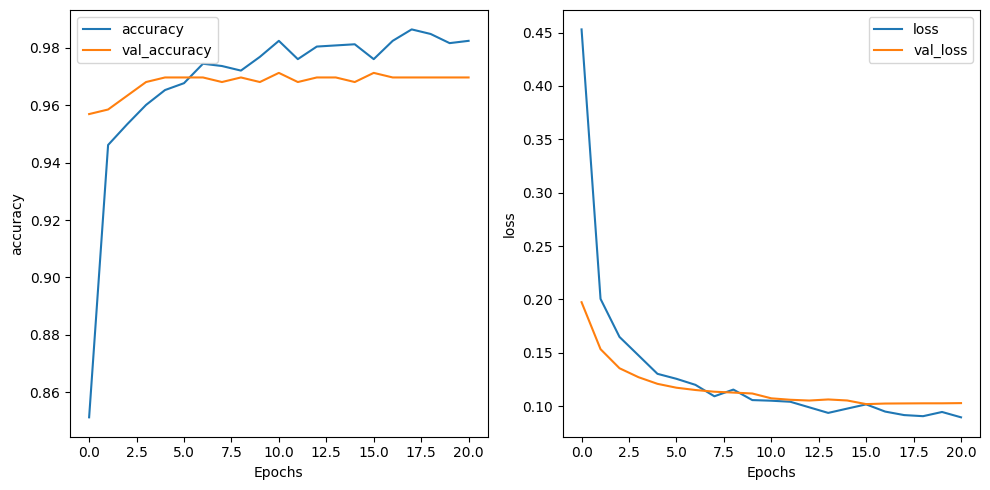

In [41]:
plot_matrix(['accuracy', 'loss'], history_efficientnet)

In [42]:
loss, acc = efficientnet_model.evaluate(process_test_ds)

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - accuracy: 0.9178 - loss: 0.2407


In [43]:
y_pred = efficientnet_model.predict(process_test_ds)

11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 397ms/step


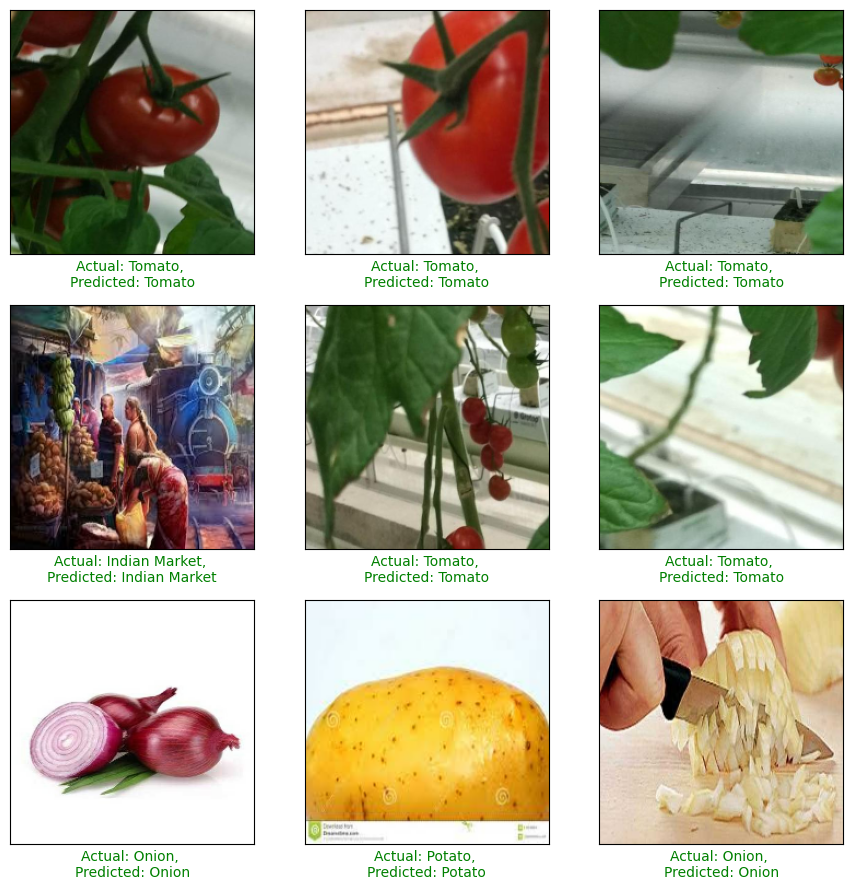

In [44]:
show_prediction(images, y_true, y_pred, 9, 3, 3)

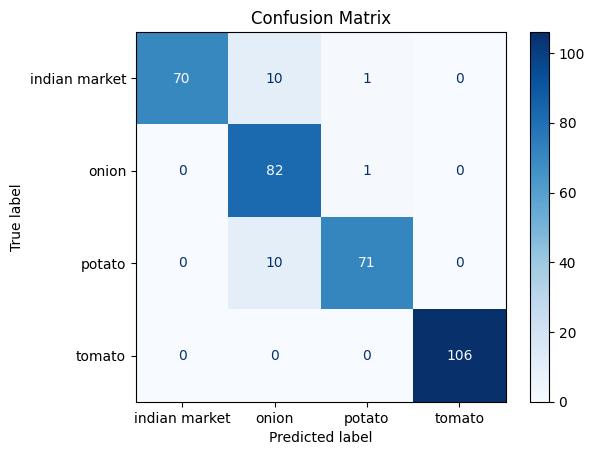

In [45]:
y_pred_classes = np.argmax(y_pred, axis=1)

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Display it
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

## MobileNet

In [46]:
log_dir = "logs/MobileNet"

callbacks = [
    EarlyStopping(monitor='val', restore_best_weights=True, patience=5, mode='min'),
    ModelCheckpoint('mobilenet_weights.h5', monitor='val_loss', save_best_only=True),
    ReduceLROnPlateau(monitor='loss', factor=0.03, patience=2),
    TensorBoard(log_dir=log_dir, histogram_freq=1)
]

In [47]:

mobilenet_base = keras.applications.MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

mobilenet_base.trainable = False

x = mobilenet_base.output

x = keras.layers.GlobalAveragePooling2D()(x)

x = keras.layers.Dropout(rate=0.3)(x)
x = keras.layers.Dense(4, activation='sigmoid', kernel_regularizer=keras.regularizers.l2(0.001))(x)

mobilenet_model = keras.models.Model(inputs=mobilenet_base.input, outputs=x)

mobilenet_model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
)

process_train_ds = train_ds_resized.map(lambda x, y: (mobilenet_preprocess(x), y))
process_val_ds = val_ds_resized.map(lambda x, y: (mobilenet_preprocess(x), y))
process_test_ds = test_ds_resized.map(lambda x,y: (mobilenet_preprocess(x), y))

history_mobile_net = mobilenet_model.fit(process_train_ds, epochs=50, validation_data=process_val_ds, callbacks=callbacks)

Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.6258 - loss: 1.0184

/Users/wasimmujawar/Developer/Ninjacart-CV-Classifier/.venv/lib/python3.12/site-packages/keras/src/callbacks/early_stopping.py:153: UserWarning: Early stopping conditioned on metric `val` which is not available. Available metrics are: accuracy,loss,val_accuracy,val_loss
  current = self.get_monitor_value(logs)


79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - accuracy: 0.6278 - loss: 1.0132 - val_accuracy: 0.9410 - val_loss: 0.1924 - learning_rate: 0.0010
Epoch 2/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.9122 - loss: 0.2445

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.9124 - loss: 0.2439 - val_accuracy: 0.9522 - val_loss: 0.1466 - learning_rate: 0.0010
Epoch 3/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9483 - loss: 0.1684

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.9483 - loss: 0.1681 - val_accuracy: 0.9553 - val_loss: 0.1246 - learning_rate: 0.0010
Epoch 4/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.9631 - loss: 0.1211

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - accuracy: 0.9631 - loss: 0.1211 - val_accuracy: 0.9537 - val_loss: 0.1153 - learning_rate: 0.0010
Epoch 5/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9636 - loss: 0.1104

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.9637 - loss: 0.1103 - val_accuracy: 0.9569 - val_loss: 0.1091 - learning_rate: 0.0010
Epoch 6/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9614 - loss: 0.1081

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.9615 - loss: 0.1078 - val_accuracy: 0.9601 - val_loss: 0.1079 - learning_rate: 0.0010
Epoch 7/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.9709 - loss: 0.0905

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.9710 - loss: 0.0905 - val_accuracy: 0.9633 - val_loss: 0.1036 - learning_rate: 0.0010
Epoch 8/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9716 - loss: 0.0974

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.9716 - loss: 0.0971 - val_accuracy: 0.9585 - val_loss: 0.1029 - learning_rate: 0.0010
Epoch 9/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.9700 - loss: 0.0889

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - accuracy: 0.9702 - loss: 0.0886 - val_accuracy: 0.9633 - val_loss: 0.1010 - learning_rate: 0.0010
Epoch 10/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9822 - loss: 0.0738

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.9821 - loss: 0.0739 - val_accuracy: 0.9633 - val_loss: 0.0999 - learning_rate: 0.0010
Epoch 11/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.9855 - loss: 0.0582 - val_accuracy: 0.9633 - val_loss: 0.1011 - learning_rate: 0.0010
Epoch 12/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.9834 - loss: 0.0708 - val_accuracy: 0.9617 - val_loss: 0.1009 - learning_rate: 0.0010
Epoch 13/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.9816 - loss: 0.0665

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.9817 - loss: 0.0664 - val_accuracy: 0.9633 - val_loss: 0.0982 - learning_rate: 0.0010
Epoch 14/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9789 - loss: 0.0656

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - accuracy: 0.9790 - loss: 0.0654 - val_accuracy: 0.9633 - val_loss: 0.0969 - learning_rate: 3.0000e-05
Epoch 15/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.9858 - loss: 0.0602

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - accuracy: 0.9858 - loss: 0.0601 - val_accuracy: 0.9649 - val_loss: 0.0966 - learning_rate: 3.0000e-05
Epoch 16/50
78/79 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9843 - loss: 0.0593

79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - accuracy: 0.9844 - loss: 0.0591 - val_accuracy: 0.9633 - val_loss: 0.0966 - learning_rate: 3.0000e-05
Epoch 17/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - accuracy: 0.9859 - loss: 0.0552 - val_accuracy: 0.9633 - val_loss: 0.0966 - learning_rate: 3.0000e-05
Epoch 18/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - accuracy: 0.9836 - loss: 0.0593 - val_accuracy: 0.9633 - val_loss: 0.0966 - learning_rate: 3.0000e-05
Epoch 19/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.9856 - loss: 0.0571 - val_accuracy: 0.9633 - val_loss: 0.0966 - learning_rate: 9.0000e-07
Epoch 20/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.9838 - loss: 0.0633 - val_accuracy: 0.9633 - val_loss: 0.0966 - learning_rate: 9.0000e-07
Epoch 21/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.9889 - loss: 0.0493 - val_accuracy: 0.9633 - val_loss: 0.0966 - learning_rate: 2.7000e-08
Epoch 22/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.9811 - los

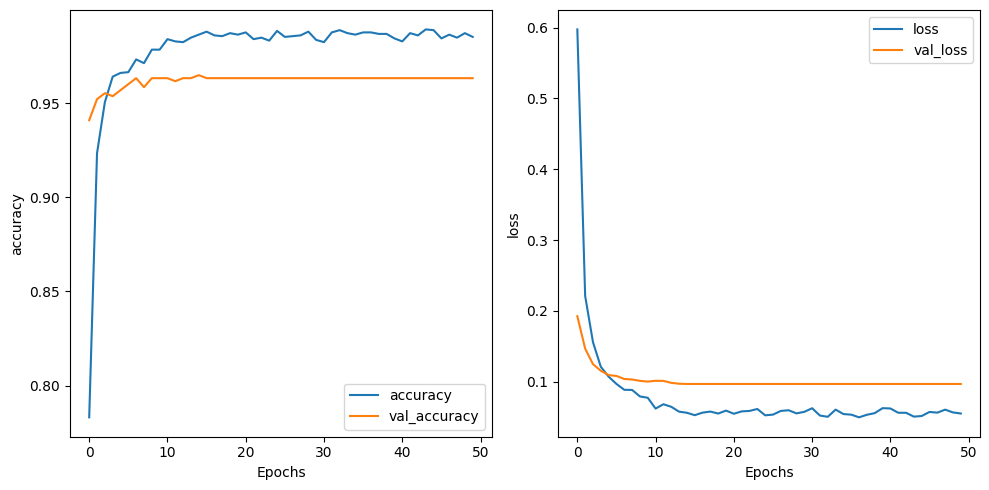

In [48]:
plot_matrix(['accuracy', 'loss'], history_mobile_net)

In [49]:
loss, acc = mobilenet_model.evaluate(process_test_ds)

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - accuracy: 0.8572 - loss: 0.4598


In [50]:
y_pred = mobilenet_model.predict(process_test_ds)

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 232ms/step


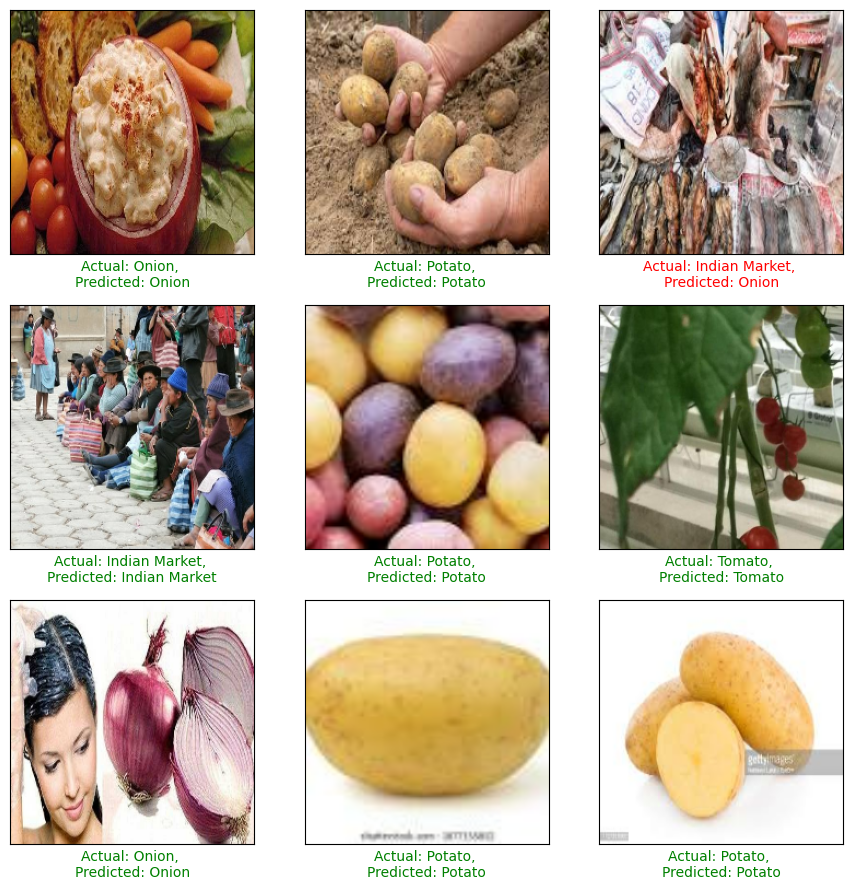

In [51]:
show_prediction(images, y_true, y_pred, 9, 3, 3)

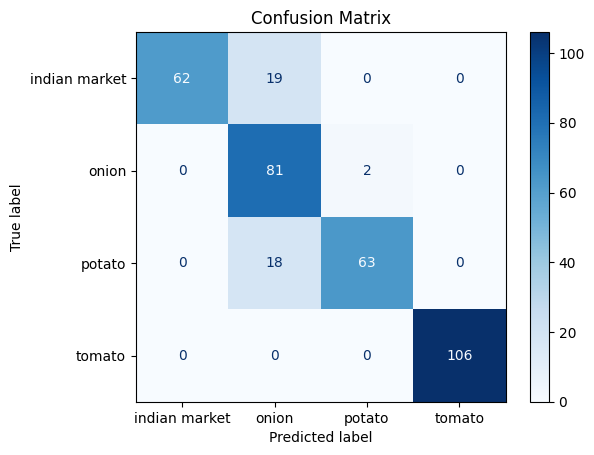

In [52]:
y_pred_classes = np.argmax(y_pred, axis=1)

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Display it
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

## Custom Model

In [53]:
custom_model = keras.Sequential([
        keras.layers.InputLayer(input_shape=[224, 224, 3]),
        
        keras.layers.Rescaling(1./255),
        
        data_augmentation,

        keras.layers.Conv2D(32, kernel_size = (3,3), padding='same', activation = 'relu'),
        keras.layers.Conv2D(32, kernel_size = (3,3), padding='same', activation = 'relu'),
        keras.layers.MaxPool2D(pool_size = (2,2)),

        keras.layers.Conv2D(64, kernel_size = (3,3), padding='same', activation = 'relu'),
        keras.layers.Conv2D(64, kernel_size = (3,3), padding='same', activation = 'relu'),
        keras.layers.MaxPool2D(pool_size = (2,2)),

        keras.layers.Conv2D(128, kernel_size = (3,3), padding='same', activation = 'relu'),
        keras.layers.MaxPool2D(pool_size = (2,2)),

        keras.layers.Conv2D(256, kernel_size = (3,3), padding='same', activation = 'relu'),
        keras.layers.Conv2D(256, kernel_size = (3,3), padding='same', activation = 'relu'),
        keras.layers.MaxPool2D(pool_size = (2,2)),
        
        keras.layers.Conv2D(512, kernel_size = (3,3), padding='same', activation = 'relu'),
        keras.layers.MaxPool2D(pool_size = (2,2)),

        keras.layers.GlobalAveragePooling2D(),
        keras.layers.Dropout(rate=0.5),
        keras.layers.Dense(512, activation = 'relu', kernel_regularizer=keras.regularizers.l2(0.001)),
        
        keras.layers.BatchNormalization(),
        keras.layers.Dropout(rate=0.4),
        keras.layers.Dense(4, activation = 'softmax') 
    ]
)

/Users/wasimmujawar/Developer/Ninjacart-CV-Classifier/.venv/lib/python3.12/site-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [54]:
custom_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_5 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,471,588 (9.43 MB)

 Trainable params: 2,470,564 (9.42 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [55]:
log_dir = "logs/CustomModel"

callbacks = [
    # EarlyStopping(monitor='val_loss', restore_best_weights=True, patience=3),
    ModelCheckpoint('custom_model_weights.h5', monitor='val_loss', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.02, patience=2),
    TensorBoard(log_dir=log_dir, histogram_freq=1)
]

In [56]:
custom_model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate = 1e-4),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
)

history = custom_model.fit(train_ds_resized, epochs=20, validation_data=val_ds_resized, callbacks=callbacks)

Epoch 1/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.4179 - loss: 1.7602

79/79 ━━━━━━━━━━━━━━━━━━━━ 28s 296ms/step - accuracy: 0.4194 - loss: 1.7577 - val_accuracy: 0.6475 - val_loss: 1.7387 - learning_rate: 1.0000e-04
Epoch 2/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.7351 - loss: 1.1813

79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - accuracy: 0.7352 - loss: 1.1809 - val_accuracy: 0.7560 - val_loss: 1.5868 - learning_rate: 1.0000e-04
Epoch 3/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7713 - loss: 1.0416

79/79 ━━━━━━━━━━━━━━━━━━━━ 21s 271ms/step - accuracy: 0.7713 - loss: 1.0414 - val_accuracy: 0.8022 - val_loss: 1.4265 - learning_rate: 1.0000e-04
Epoch 4/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 0.7839 - loss: 0.9631

79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 279ms/step - accuracy: 0.7840 - loss: 0.9629 - val_accuracy: 0.7735 - val_loss: 1.2507 - learning_rate: 1.0000e-04
Epoch 5/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.7931 - loss: 0.9423

79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 284ms/step - accuracy: 0.7932 - loss: 0.9420 - val_accuracy: 0.8596 - val_loss: 1.0366 - learning_rate: 1.0000e-04
Epoch 6/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.8263 - loss: 0.8366

79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - accuracy: 0.8263 - loss: 0.8364 - val_accuracy: 0.8485 - val_loss: 0.8629 - learning_rate: 1.0000e-04
Epoch 7/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 274ms/step - accuracy: 0.8134 - loss: 0.8290 - val_accuracy: 0.7687 - val_loss: 0.9741 - learning_rate: 1.0000e-04
Epoch 8/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.8440 - loss: 0.7661

79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - accuracy: 0.8440 - loss: 0.7660 - val_accuracy: 0.8565 - val_loss: 0.6961 - learning_rate: 1.0000e-04
Epoch 9/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 21s 271ms/step - accuracy: 0.8405 - loss: 0.7519 - val_accuracy: 0.7719 - val_loss: 0.9846 - learning_rate: 1.0000e-04
Epoch 10/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.8330 - loss: 0.7422

79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 278ms/step - accuracy: 0.8331 - loss: 0.7420 - val_accuracy: 0.8676 - val_loss: 0.6569 - learning_rate: 1.0000e-04
Epoch 11/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 279ms/step - accuracy: 0.8736 - loss: 0.6840 - val_accuracy: 0.8437 - val_loss: 0.7409 - learning_rate: 1.0000e-04
Epoch 12/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.8481 - loss: 0.6845

79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 275ms/step - accuracy: 0.8481 - loss: 0.6845 - val_accuracy: 0.8724 - val_loss: 0.6378 - learning_rate: 1.0000e-04
Epoch 13/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 275ms/step - accuracy: 0.8550 - loss: 0.6663 - val_accuracy: 0.8469 - val_loss: 0.6995 - learning_rate: 1.0000e-04
Epoch 14/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 275ms/step - accuracy: 0.8701 - loss: 0.6207 - val_accuracy: 0.8596 - val_loss: 0.6428 - learning_rate: 1.0000e-04
Epoch 15/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.8683 - loss: 0.6113

79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 276ms/step - accuracy: 0.8683 - loss: 0.6111 - val_accuracy: 0.8836 - val_loss: 0.5880 - learning_rate: 2.0000e-06
Epoch 16/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 272ms/step - accuracy: 0.8864 - loss: 0.5719 - val_accuracy: 0.8676 - val_loss: 0.5960 - learning_rate: 2.0000e-06
Epoch 17/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 277ms/step - accuracy: 0.8717 - loss: 0.6017 - val_accuracy: 0.8740 - val_loss: 0.5910 - learning_rate: 2.0000e-06
Epoch 18/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 276ms/step - accuracy: 0.8752 - loss: 0.5895 - val_accuracy: 0.8740 - val_loss: 0.5891 - learning_rate: 4.0000e-08
Epoch 19/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 276ms/step - accuracy: 0.8880 - loss: 0.5831 - val_accuracy: 0.8724 - val_loss: 0.5884 - learning_rate: 4.0000e-08
Epoch 20/20
79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 274ms/step - accuracy: 0.8791 - loss: 0.5663 - val_accuracy: 0.8724 - val_loss: 0.5884 - learning_rate: 8.0000e-10


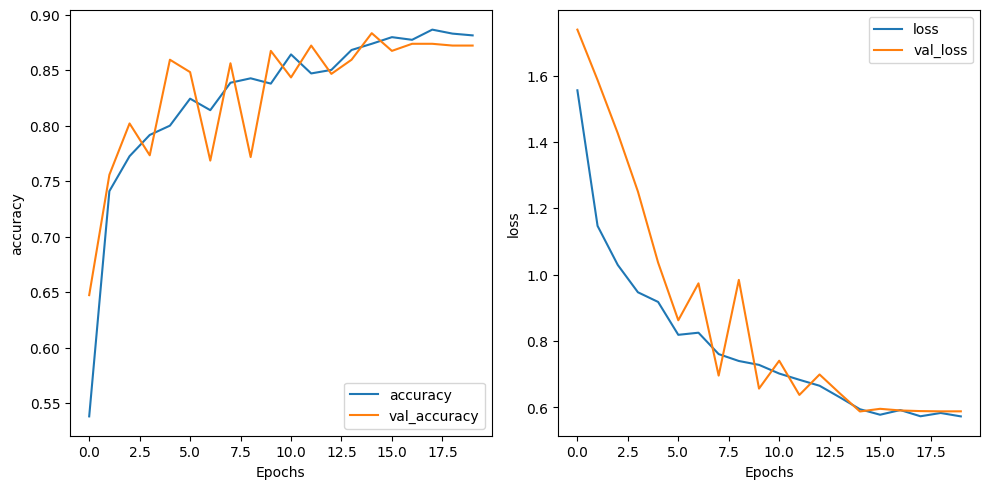

In [57]:
plot_matrix(['accuracy', 'loss'], history)

In [58]:
loss, acc = custom_model.evaluate(test_ds_resized)

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8868 - loss: 0.6060


In [59]:
y_pred = custom_model.predict(test_ds_resized)

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step


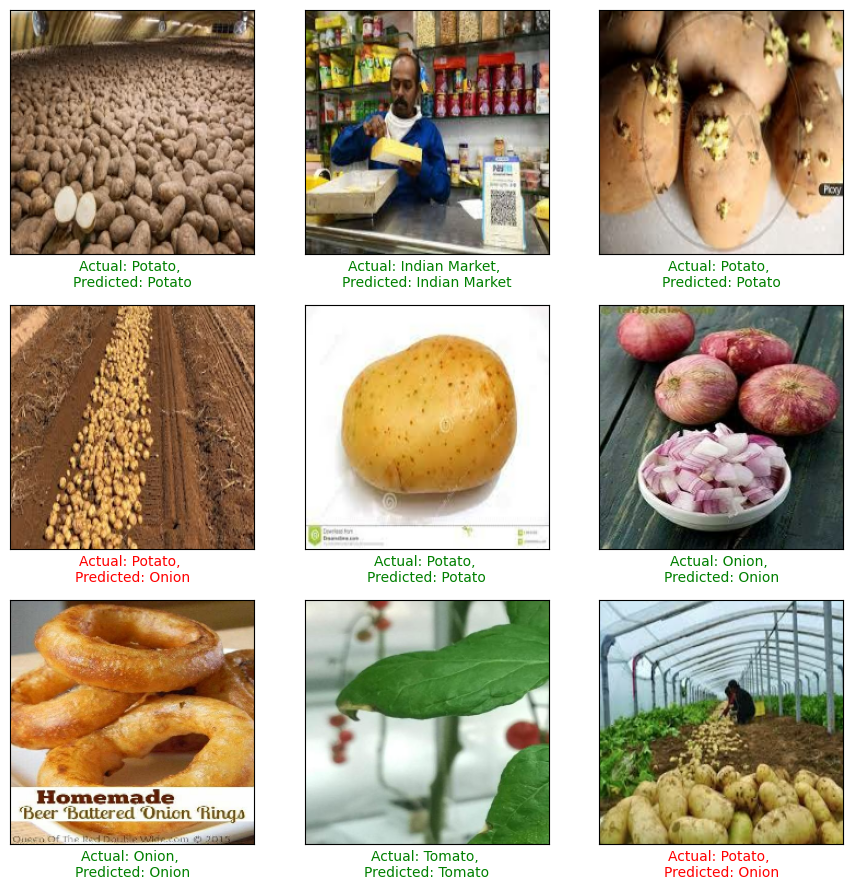

In [60]:
show_prediction(images, y_true, y_pred, 9, 3, 3)

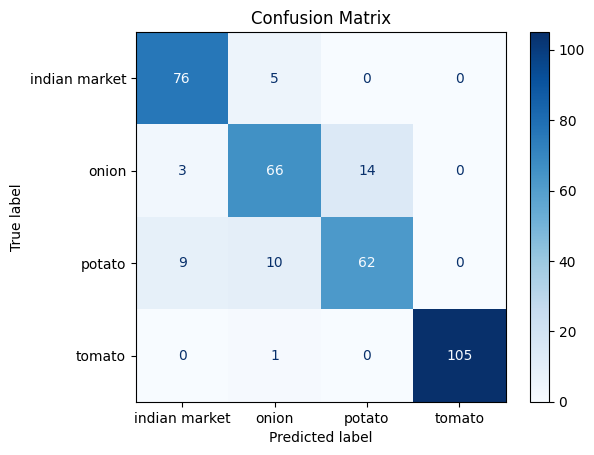

In [61]:
y_pred_classes = np.argmax(y_pred, axis=1)

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Display it
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

## Conclusion

Below performance is achieved:

| Model           | Train Accuracy (%) | Validation Accuracy (%)  | Test Accuracy (%) |
|-----------------|--------------------|--------------------------|-------------------|
| VGG16           | 95.02              | 95.37                    | 81.13             |
| ResNet50        | 94.89              | 87.56                    | 89.47             |
| EfficientNetB0   | 98.48              | 96.97                    | 91.78             |
| MobileNet       | 98.36              | 96.33                    | 85.72             |
| Custom Model    | 87.91              | 87.24                    | 88.68             |


In [62]:
!tensorboard --logdir=logs

/Users/wasimmujawar/Developer/Ninjacart-CV-Classifier/.venv/lib/python3.12/site-packages/tensorboard/default.py:30: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/Users/wasimmujawar/Developer/Ninjacart-CV-Classifier/.venv/lib/python3.12/site-packages/tensorboard/_vendor/bleach/sanitizer.py:292: SyntaxWarning: invalid escape sequence '\s'
  "[`\000-\040\177-\240\s]+",
/Users/wasimmujawar/Developer/Ninjacart-CV-Classifier/.venv/lib/python3.12/site-packages/tensorboard/_vendor/bleach/sanitizer.py:339: SyntaxWarning: invalid escape sequence '\s'
  style = re.compile('url\s*\(\s*[^\s)]+?\s*\)\s*').sub(' ', style)
/Users/wasimmujawar/Developer/Ninjacart-CV-Classifier/.venv/lib/python3.12/site-packages/tensorboard/_vendor/bleach/sanitizer.py:354: SyntaxWarning: invalid escape s